**HW 5**    
  
Friday 04/18/2025  
DS 3001 Spring 2025  
Teresa Duong  

Task: you will be bottlenecking or fine-tuning an image classification model (your choice) to classify a new set of images. <br/>
Dataset: https://www.kaggle.com/datasets/gpiosenka/cards-image-datasetclassification -- there are 14 classes, one for each rank of traditional playing card (e.g. King).
Instructions:
* Select a pretrained model (e.g. VGG16).
* Select your method -- either bottlenecking or fine-tuning -- be sure to classify the 14 classes inherent to the dataset provided.
* Use k-fold validation (k=5) and demonstrate your architecture works well on your validation set.
* Visualize your results.
* Visualize the feature maps of your resultant network, rendering them for at least two face-card types and at least two number-card types.

If you get poor performance (< 90% validation accuracy) no matter what you try, please apply some form of data augmentation in order to boost your performance over the top. If that doesn't work, at least you'll have demonstrated you tried.

In [83]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
from torchvision.models import vgg16
from torch.utils.data import DataLoader
from sklearn.metrics import confusion_matrix
import seaborn as sns
from tqdm import tqdm
import os

**Dataset Loading, Data Augmentation, K-Fold Setup, and Visualizing Examples**

In [ ]:
from sklearn.model_selection import KFold
from torch.utils.data import DataLoader, Subset

# K-fold cross-validation
k = 5  # Five folds
kf = KFold(n_splits=k, shuffle=True, random_state=1) # Shuffling before splitting
metrics_list = [] # For performance metrics

from torchvision import datasets, transforms
from torch.utils.data import ConcatDataset

transform = transforms.Compose([
    transforms.Resize((200, 200)),
    #transforms.RandomHorizontalFlip(p=0.5),  # Flip images horizontally
    #transforms.RandomRotation(degrees=10),  # Reduce rotation range
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

train_path = 'cards_reorganized/train'
test_path = 'cards_reorganized/test'
valid_path = 'cards_reorganized/valid'

# Reproducibility Seed
seed = 42
torch.manual_seed(seed)

# Create a shared dataiter
dataiter = iter(train_loader)

# Use full dataset (train + valid for cross-validation)
train_dataset = datasets.ImageFolder(train_path, transform=transform)
test_dataset = datasets.ImageFolder(test_path, transform=transform)
valid_dataset = datasets.ImageFolder(valid_path, transform=transform)

# Combine train and validation datasets
full_dataset = ConcatDataset([train_dataset, train_dataset, valid_dataset])

print(f"Total images in combined dataset: {len(full_dataset)}")

# Visualize some examples
def show_examples(full_dataset, num_examples=5):
    fig, axes = plt.subplots(1, num_examples, figsize=(15, 3))
    for i in range(num_examples):
        img, label = full_dataset[i]
        img = img[0]  # Take first channel since they're all the same
        img = img.numpy()
        axes[i].imshow(img, cmap='gray')
        axes[i].set_title(f"Label: {label}")
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Show some examples
show_examples(train_dataset)

Total images in combined dataset: 4233


**Bottlenecking, Model Training, Evaluation Function**

In [85]:
# Set device
device = torch.device("mps" if torch.backends.mps.is_available() else 
                     ("cuda" if torch.cuda.is_available() else "cpu"))
print(f"Using device: {device}")

# Hyperparameters
batch_size = 64
num_epochs = 10
learning_rate = 0.001

train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=True)

# Bottlenecking VGG16 for cards_reorganized dataset (14 classes)
class VGG16_cards_reorganized(nn.Module):
    def __init__(self, num_classes=14):
        super(VGG16_cards_reorganized, self).__init__()
        # Load pretrained VGG16 with updated weights parameter
        vgg = vgg16(weights=torchvision.models.VGG16_Weights.IMAGENET1K_V1)
        
        # Freeze feature layers
        for param in vgg.features.parameters():
            param.requires_grad = False
            
        # Modify classifier for cards_reorganized dataset
        vgg.classifier = nn.Sequential(
        nn.Linear(25088, 4096),
        nn.ReLU(),
        nn.Dropout(0.5),
        nn.Linear(4096, 1024),
        nn.ReLU(),
        nn.Dropout(0.5),
        nn.Linear(1024, num_classes)
    )
        
        self.features = vgg.features
        self.avgpool = vgg.avgpool
        self.classifier = vgg.classifier
        
    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

# Initialize model
model = VGG16_cards_reorganized().to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Learning rate scheduler
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3)


# Training function
def train_model():
    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []
    
    for epoch in range(num_epochs):
        # Training phase
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        
        progress_bar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}')
        for images, labels in progress_bar:
            images, labels = images.to(device), labels.to(device)
            
            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            # Backward and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            # Statistics
            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            
            progress_bar.set_postfix({'loss': running_loss/len(progress_bar), 
                                      'accuracy': 100 * correct / total})
        
        epoch_loss = running_loss / len(train_loader)
        epoch_acc = 100 * correct / total
        train_losses.append(epoch_loss)
        train_accs.append(epoch_acc)
        
        print(f'Epoch {epoch+1}/{num_epochs}, Training Loss: {epoch_loss:.4f}, Training Accuracy: {epoch_acc:.2f}%')
        
        # Validation phase
        model.eval()
        val_loss = 0.0
        correct = 0
        total = 0
        
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
                
                # Calculate accuracy
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()
        
        val_loss /= len(val_loader)
        val_accuracy = 100 * correct / total
        val_losses.append(val_loss)
        val_accs.append(val_accuracy)
        
        print(f"Epoch {epoch+1}/{num_epochs}, Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%")
        scheduler.step(val_loss)
    
    return train_losses, train_accs, val_losses, val_accs

# Plot training history
def plot_training_history(train_losses, val_losses, train_accuracies, val_accuracies):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # Plot loss
    ax1.plot(train_losses, label='Training Loss', color='blue')
    ax1.plot(val_losses, label='Validation Loss', color='orange')
    ax1.set_title('Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()
    
    # Plot accuracy
    ax2.plot(train_accuracies, label='Training Accuracy', color='blue')
    ax2.plot(val_accuracies, label='Validation Accuracy', color='orange')
    ax2.set_title('Accuracy')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy (%)')
    ax2.legend()
    
    plt.tight_layout()
    plt.show() 

Using device: cpu


In [86]:
# Evaluation function
def evaluate_model():
    model.eval()
    correct = 0
    total = 0
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc='Evaluating'):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    accuracy = 100 * correct / total
    print(f'Test Accuracy: {accuracy:.2f}%')
    
    return all_preds, all_labels, accuracy

**Model Visualization**

In [87]:
# Visualize predictions
def visualize_predictions(num_examples=10):
    model.eval()
    fig, axes = plt.subplots(2, num_examples, figsize=(20, 5))
    
    # Get the class-to-index mapping and reverse it
    idx_to_class = {v: k for k, v in train_dataset.class_to_idx.items()}
    
    # Shuffle the test dataset
    shuffled_indices = torch.randperm(len(test_loader.dataset))
    shuffled_loader = DataLoader(test_loader.dataset, batch_size=num_examples, sampler=shuffled_indices)
    
    # Get a batch of shuffled data
    dataiter = iter(shuffled_loader)
    images, labels = next(dataiter)
    
    with torch.no_grad():
        images = images.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
    
    for i in range(num_examples):
        # Display original image
        img = images[i].cpu().numpy().transpose(1, 2, 0)  # Convert to HWC format
        axes[0, i].imshow(img, cmap='gray')
        axes[0, i].set_title(f"True: {idx_to_class[labels[i].item()]}")
        axes[0, i].axis('off')
        
        # Display prediction
        axes[1, i].imshow(img, cmap='gray')
        pred = predicted[i].item()
        color = 'green' if pred == labels[i].item() else 'red'
        axes[1, i].set_title(f"Pred: {idx_to_class[pred]}", color=color)
        axes[1, i].axis('off')
    
    plt.tight_layout()
    plt.show()

**Confusion Matrix**

In [88]:

# Plot confusion matrix
def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()


**Main Execution**

Epoch 1/10: 100%|██████████| 33/33 [4:22:18<00:00, 476.93s/it, loss=2.12, accuracy=35.5]    


Epoch 1/10, Training Loss: 2.1158, Training Accuracy: 35.51%
Epoch 1/10, Validation Loss: 0.4797, Validation Accuracy: 72.31%


Epoch 2/10: 100%|██████████| 33/33 [2:50:52<00:00, 310.69s/it, loss=0.85, accuracy=70.8]     


Epoch 2/10, Training Loss: 0.8499, Training Accuracy: 70.78%
Epoch 2/10, Validation Loss: 2.0632, Validation Accuracy: 86.15%


Epoch 3/10: 100%|██████████| 33/33 [05:58<00:00, 10.86s/it, loss=0.491, accuracy=84.7]


Epoch 3/10, Training Loss: 0.4909, Training Accuracy: 84.74%
Epoch 3/10, Validation Loss: 0.3075, Validation Accuracy: 80.00%


Epoch 4/10: 100%|██████████| 33/33 [06:32<00:00, 11.90s/it, loss=0.395, accuracy=87.4]


Epoch 4/10, Training Loss: 0.3955, Training Accuracy: 87.43%
Epoch 4/10, Validation Loss: 0.2415, Validation Accuracy: 84.62%


Epoch 5/10: 100%|██████████| 33/33 [05:56<00:00, 10.81s/it, loss=0.294, accuracy=90.5] 


Epoch 5/10, Training Loss: 0.2944, Training Accuracy: 90.55%
Epoch 5/10, Validation Loss: 0.2331, Validation Accuracy: 89.23%


Epoch 6/10: 100%|██████████| 33/33 [12:55<00:00, 23.51s/it, loss=0.301, accuracy=91.5] 


Epoch 6/10, Training Loss: 0.3012, Training Accuracy: 91.51%
Epoch 6/10, Validation Loss: 0.1894, Validation Accuracy: 87.69%


Epoch 7/10: 100%|██████████| 33/33 [12:59<00:00, 23.62s/it, loss=0.278, accuracy=92.1] 


Epoch 7/10, Training Loss: 0.2778, Training Accuracy: 92.13%
Epoch 7/10, Validation Loss: 0.1824, Validation Accuracy: 89.23%


Epoch 8/10: 100%|██████████| 33/33 [12:38<00:00, 22.98s/it, loss=0.227, accuracy=93.8] 


Epoch 8/10, Training Loss: 0.2270, Training Accuracy: 93.76%
Epoch 8/10, Validation Loss: 0.2516, Validation Accuracy: 86.15%


Epoch 9/10: 100%|██████████| 33/33 [11:18<00:00, 20.57s/it, loss=0.196, accuracy=93.6] 


Epoch 9/10, Training Loss: 0.1955, Training Accuracy: 93.57%
Epoch 9/10, Validation Loss: 0.2013, Validation Accuracy: 89.23%


Epoch 10/10: 100%|██████████| 33/33 [36:10<00:00, 65.77s/it, loss=0.206, accuracy=94.5] 


Epoch 10/10, Training Loss: 0.2055, Training Accuracy: 94.48%
Epoch 10/10, Validation Loss: 0.2702, Validation Accuracy: 90.77%


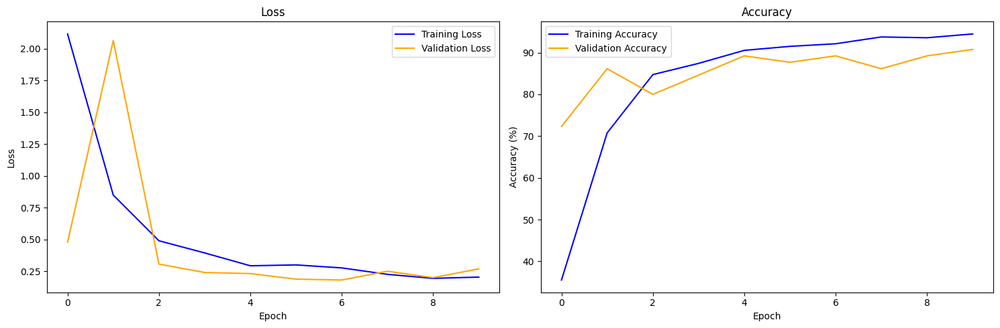

Evaluating model...


Evaluating: 100%|██████████| 2/2 [00:23<00:00, 11.61s/it]


Test Accuracy: 78.46%


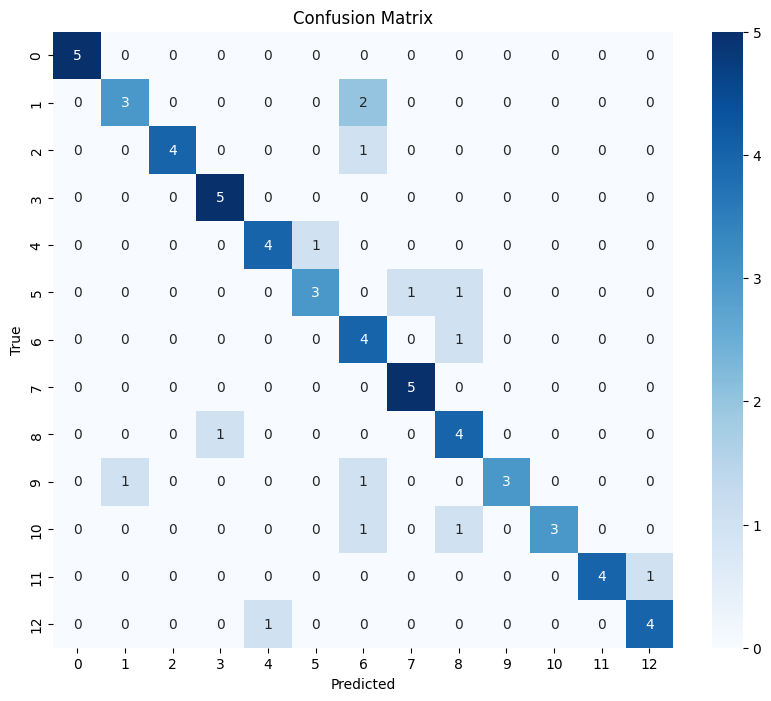

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99215686..0.9843137].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99215686..0.9843137].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9607843].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9607843].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the vali

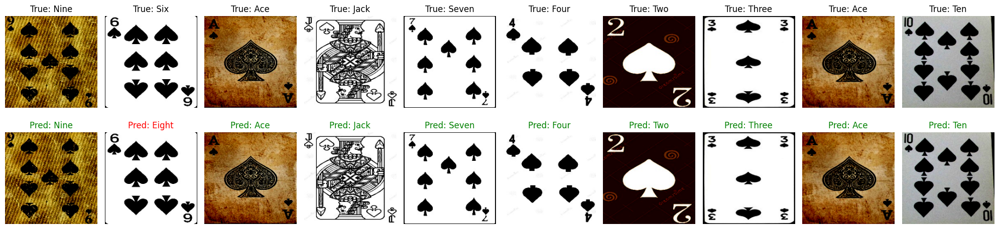

In [90]:
train_losses, train_accs, val_losses, val_accuracies = train_model()

# Plot training and validation loss curves
plot_training_history(train_losses, val_losses, train_accs, val_accuracies)
        
# Evaluate the model
print("Evaluating model...")
all_preds, all_labels, test_accuracy = evaluate_model()
        
# Plot confusion matrix
plot_confusion_matrix(all_labels, all_preds)
        
# Visualize some predictions
visualize_predictions()

**Feature Maps**

In [ ]:
seed = 42
torch.manual_seed(seed)
dataiter = iter(train_loader)

# Create the DataLoader with shuffle=True
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)


# Visualize feature maps from early layers
def visualize_feature_maps(image_idx=0):
    # Get a single image    images, labels = next(dataiter)
    img = images[image_idx:image_idx+1].to(device)
    
    # Create a modified model that outputs feature maps from early layers
    class FeatureExtractor(nn.Module):
        def __init__(self, model, layers):
            super(FeatureExtractor, self).__init__()
            self.model = model
            self.layers = layers
            self._features = {layer: torch.empty(0) for layer in layers}
            
            # Register hooks to save feature maps
            for layer_id in layers:
                layer = dict([*self.model.named_modules()])[layer_id]
                layer.register_forward_hook(self.save_outputs_hook(layer_id))
        
        def save_outputs_hook(self, layer_id):
            def fn(_, __, output):
                self._features[layer_id] = output
            return fn
        
        def forward(self, x):
            _ = self.model(x)
            return self._features
    
    # Define layers to extract (early convolutional layers)
    layers_to_extract = [
        'features.0',   # First conv layer
        'features.2',   # Second conv layer
        'features.5',   # After first max pooling
        'features.7'    # Another early conv layer
    ]
    
    # Create feature extractor
    feature_extractor = FeatureExtractor(model, layers_to_extract)
    feature_extractor.eval()
    
    # Get feature maps
    with torch.no_grad():
        features = feature_extractor(img)
 
    # Show feature maps for each layer in separate figures
    for layer_id in layers_to_extract:
        # Get feature maps for this layer
        feature_map = features[layer_id][0].cpu()
        
        # Create a grid of feature maps
        num_features = min(16, feature_map.size(0))  # Show up to 16 feature maps
        grid_size = int(np.ceil(np.sqrt(num_features)))
        
        # Create a new figure for this layer
        fig = plt.figure(figsize=(12, 12))
        plt.suptitle(f"{layer_id}", fontsize=16)
        
        for j in range(num_features):
            ax = fig.add_subplot(grid_size, grid_size, j + 1)
            
            # Normalize the feature map for better visualization
            f_map = feature_map[j].numpy()
            f_map = (f_map - f_map.min()) / (f_map.max() - f_map.min() + 1e-8)  # Avoid division by zero
            
            ax.imshow(f_map, cmap='viridis')
            ax.set_title(f"Filter {j}")
            ax.axis('off')
        
        plt.tight_layout(rect=[0, 0, 1, 0.95])  # Make room for suptitle
        plt.show()

**Feature Maps for Early Layers 0, 2, 5, and 7**

Feature Maps for Jack of Spades

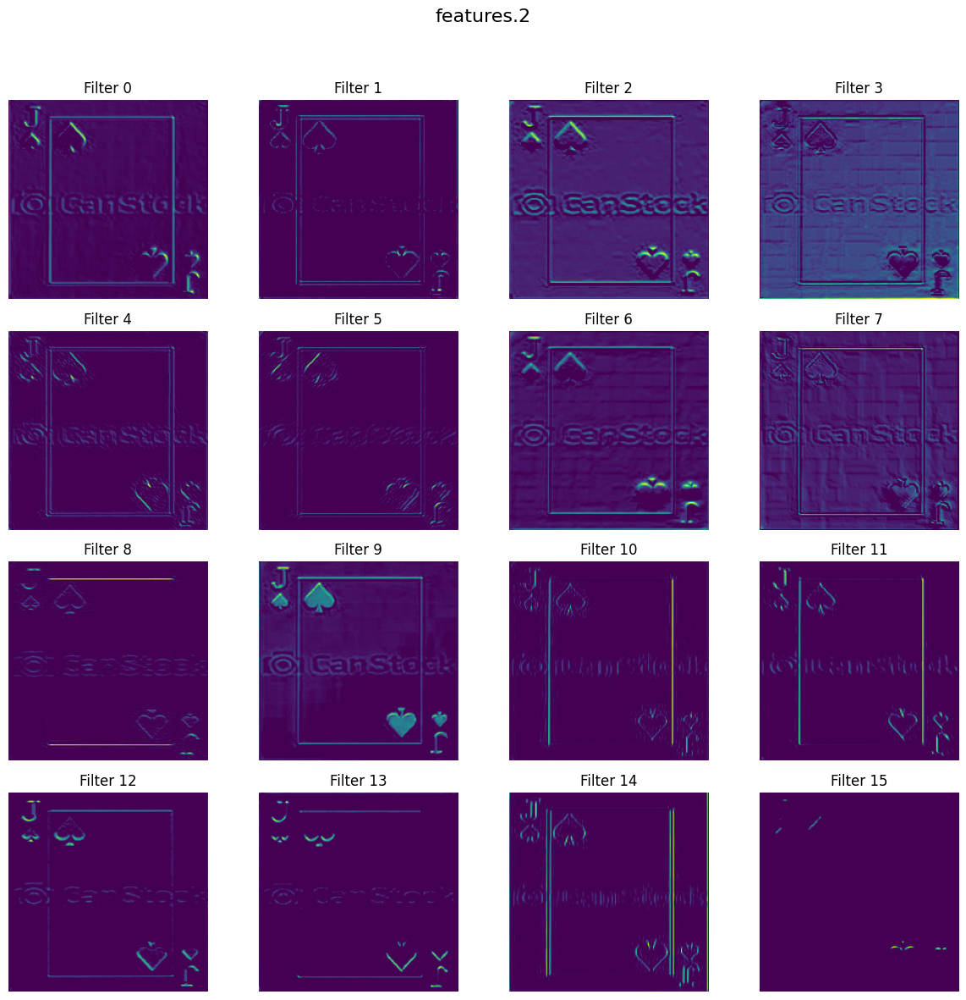

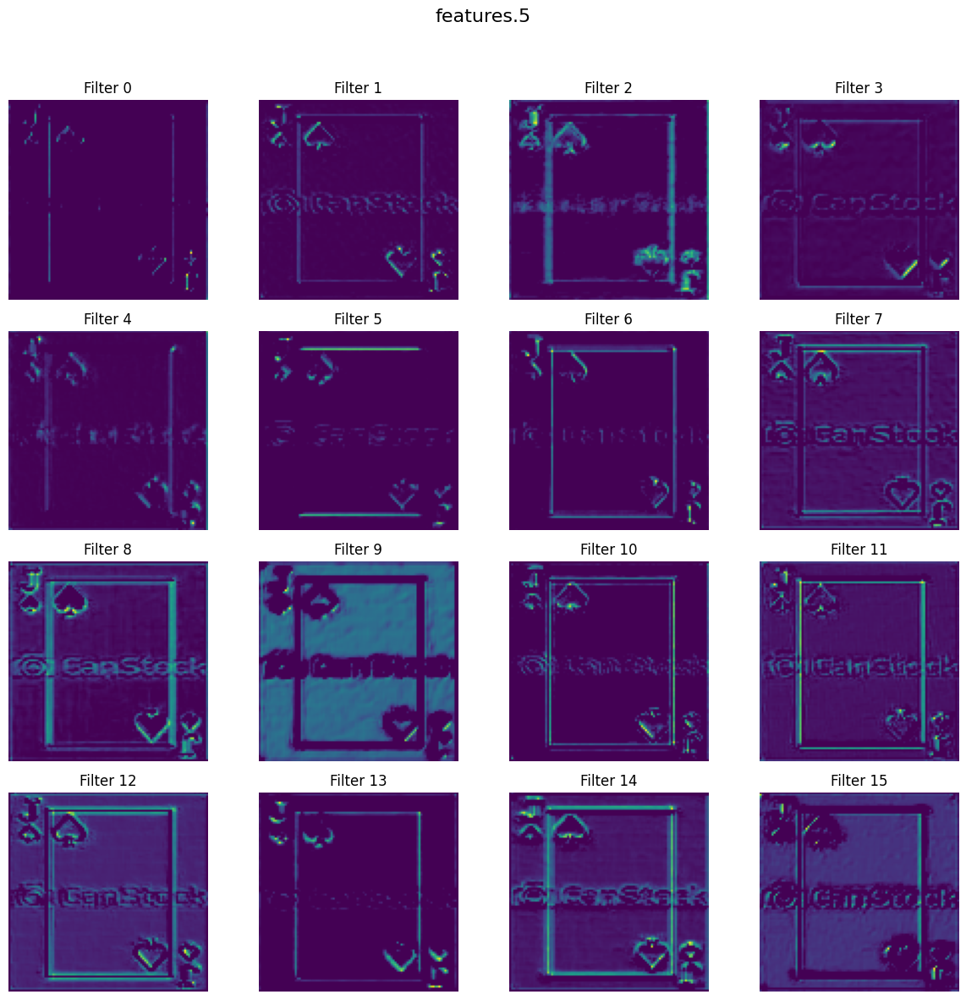

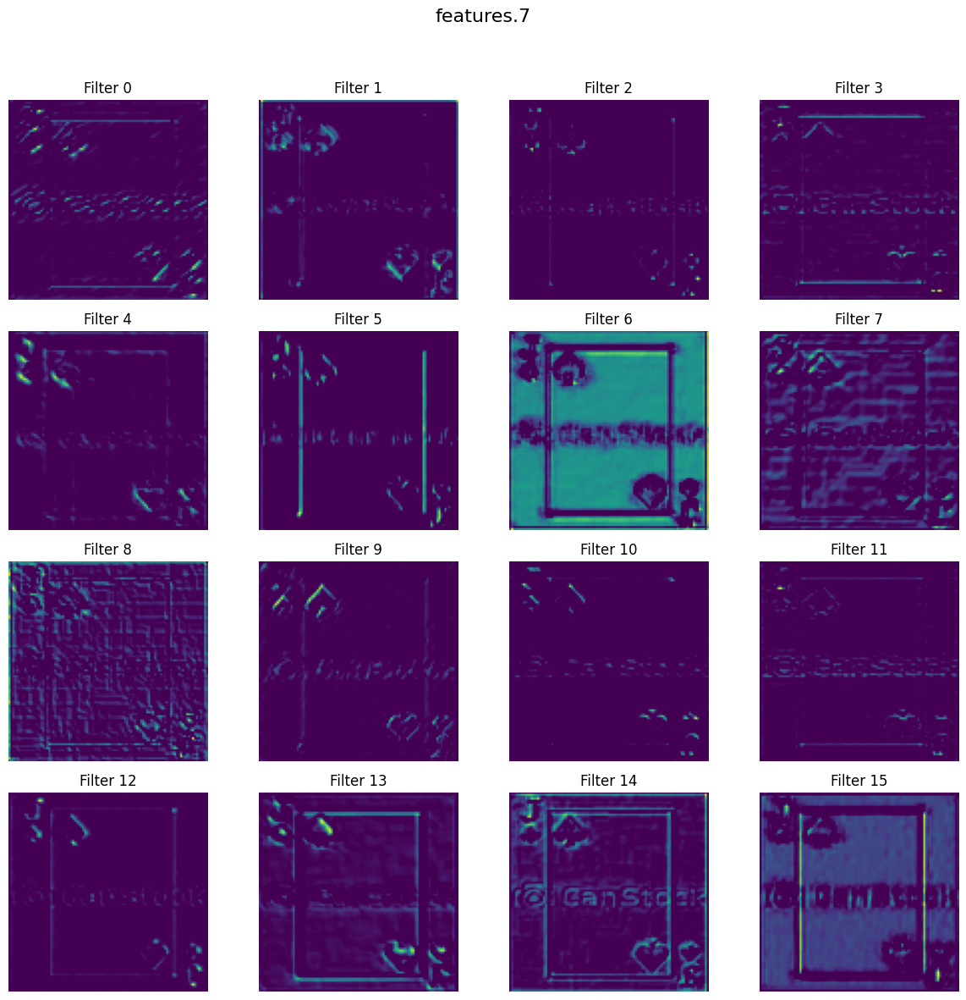

In [115]:
visualize_feature_maps(image_idx=0)

Feature Maps for 3 of Spades

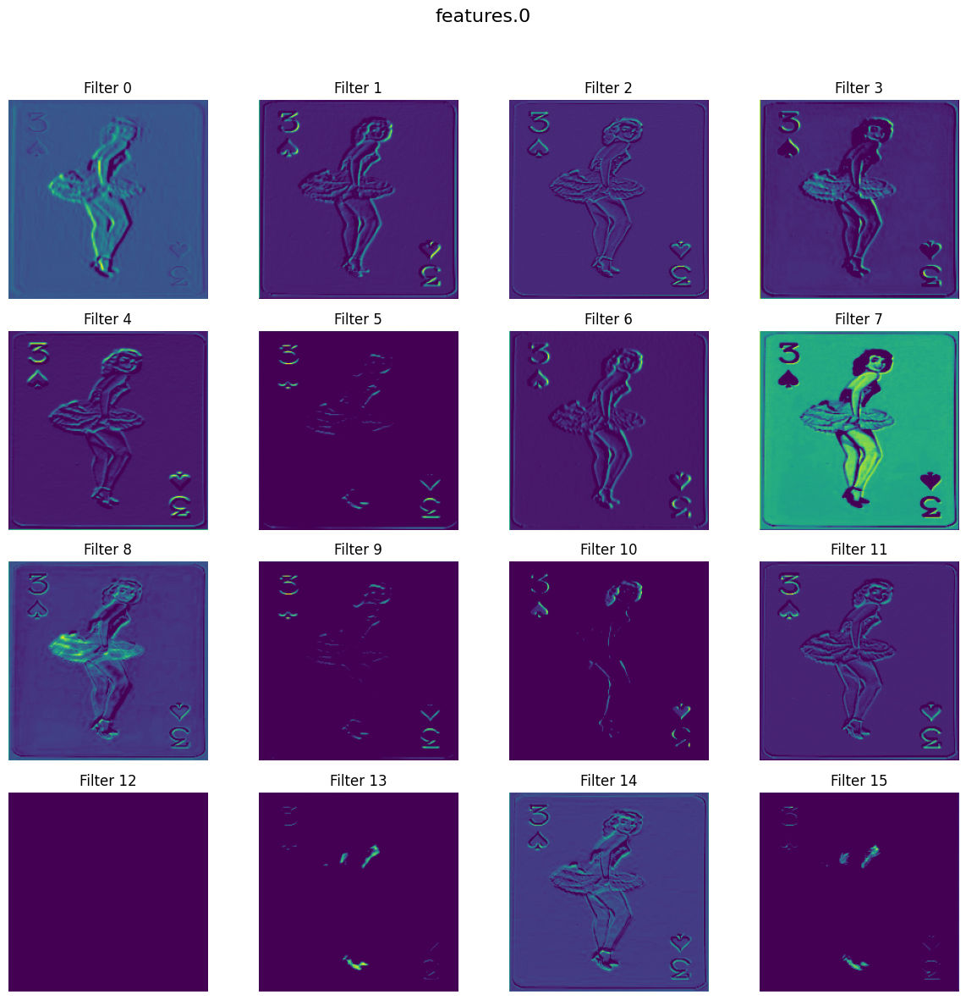

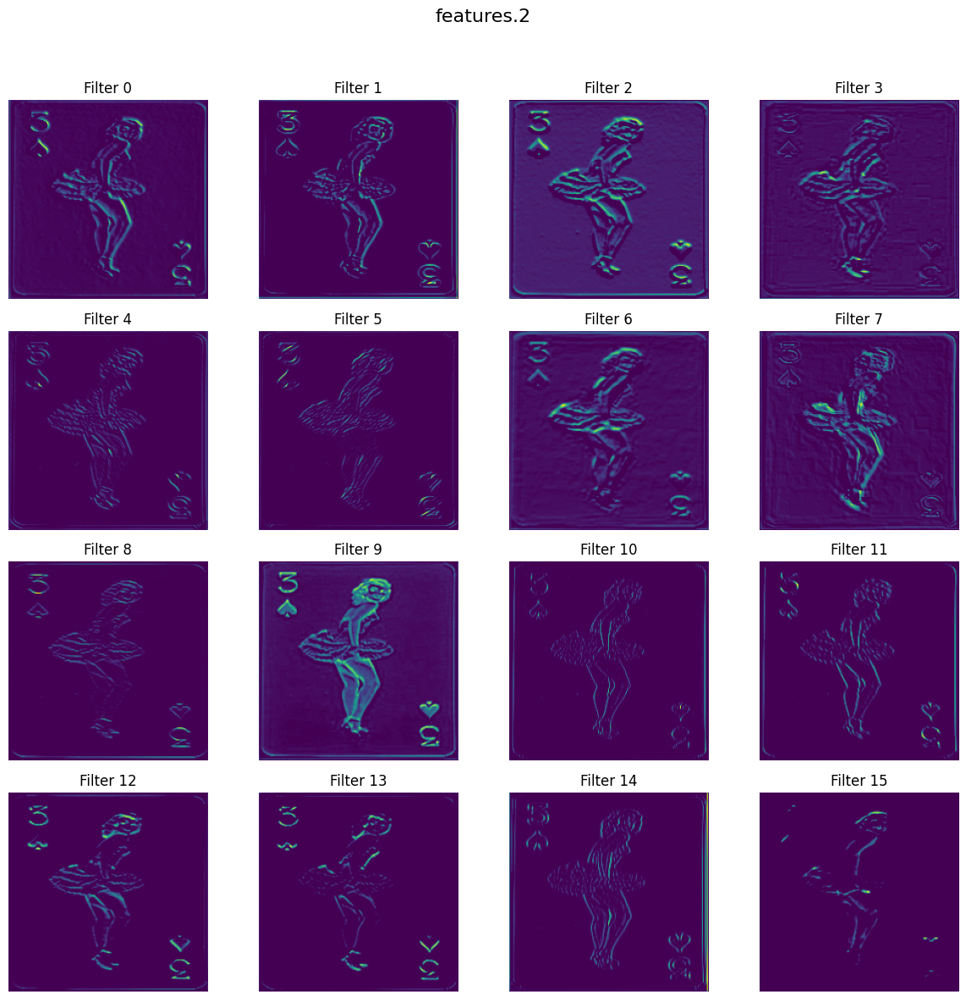

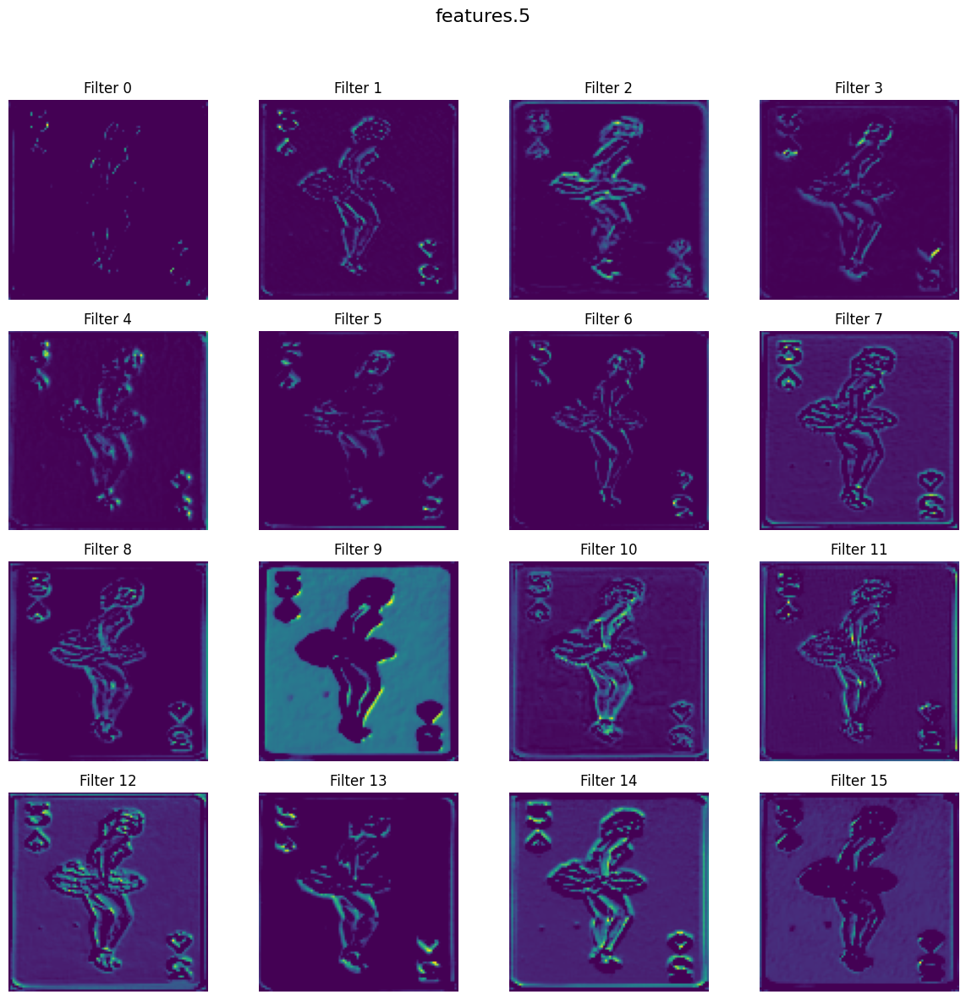

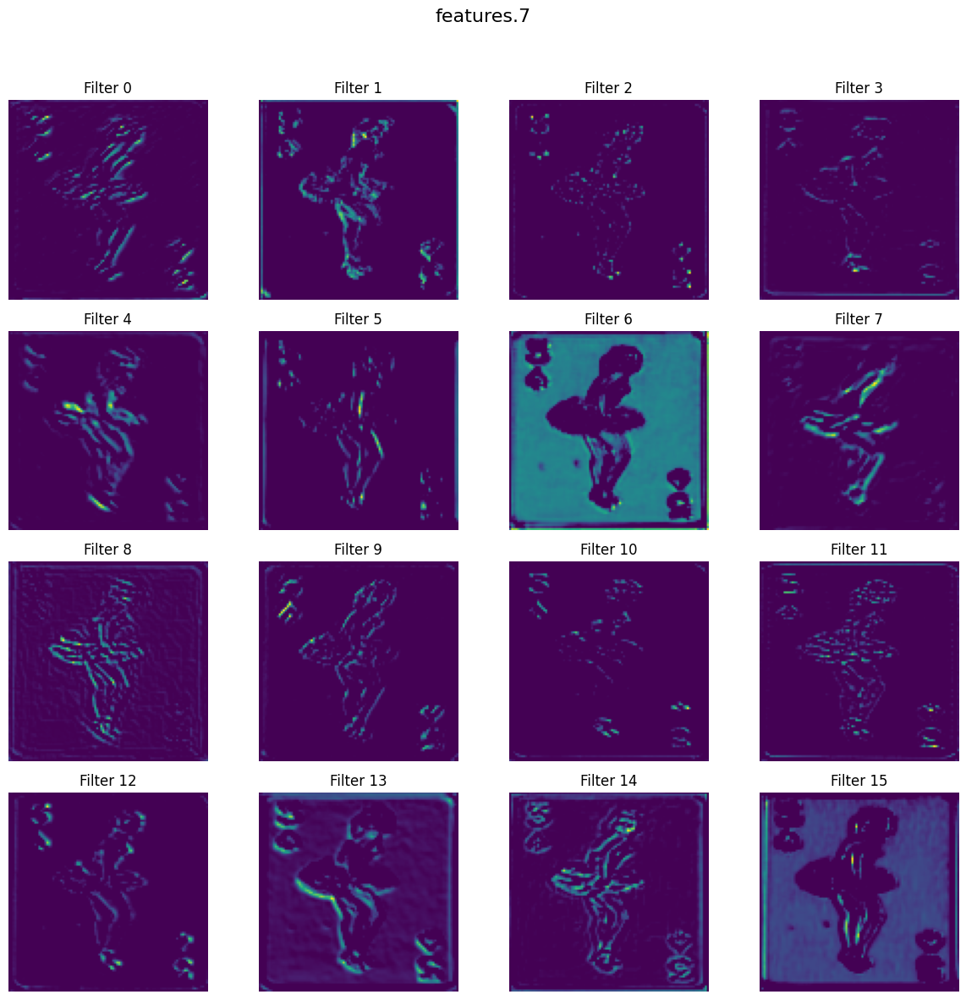

In [116]:
visualize_feature_maps(image_idx=1)

Feature Maps for 8 of Diamonds

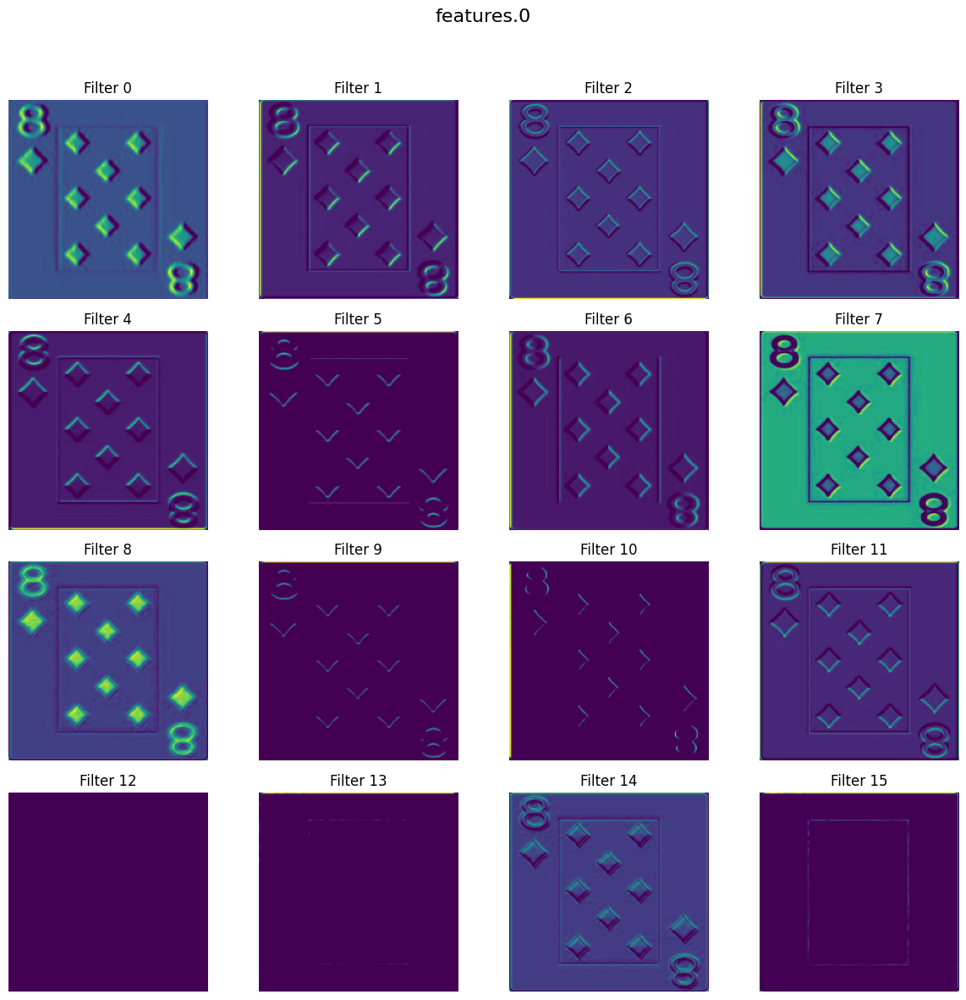

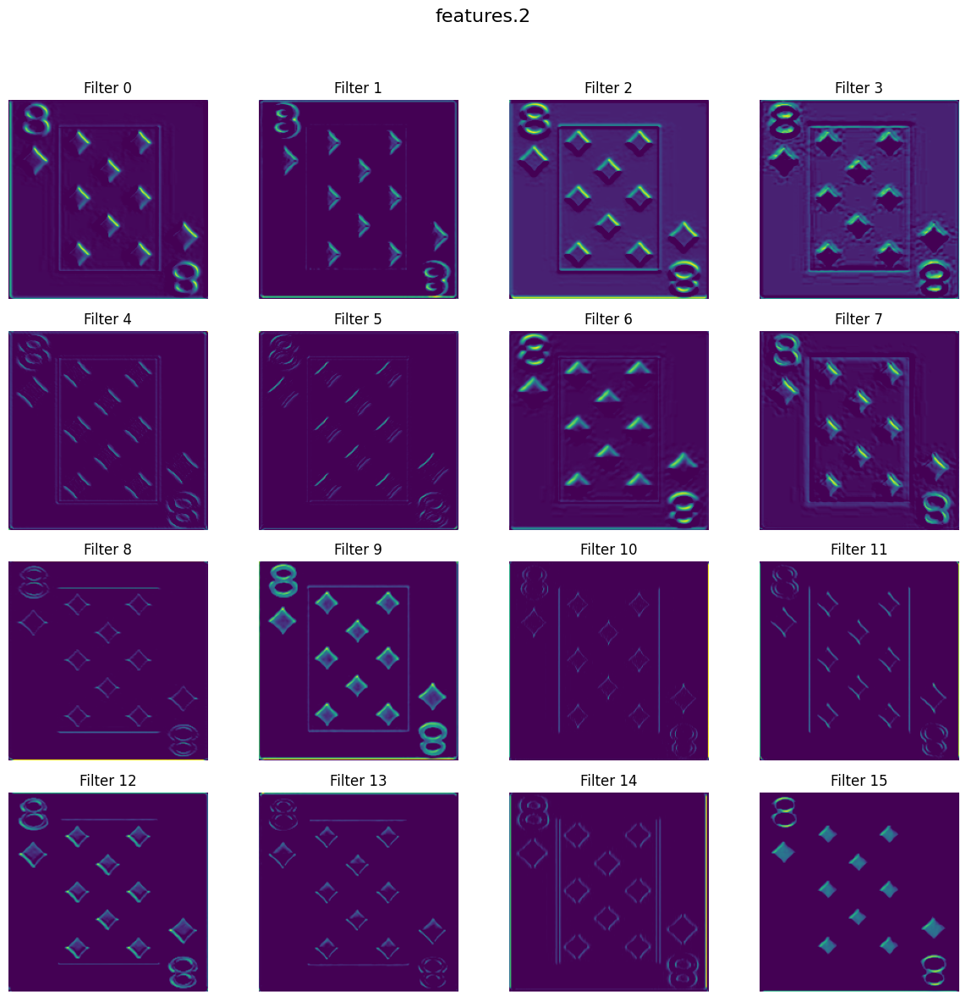

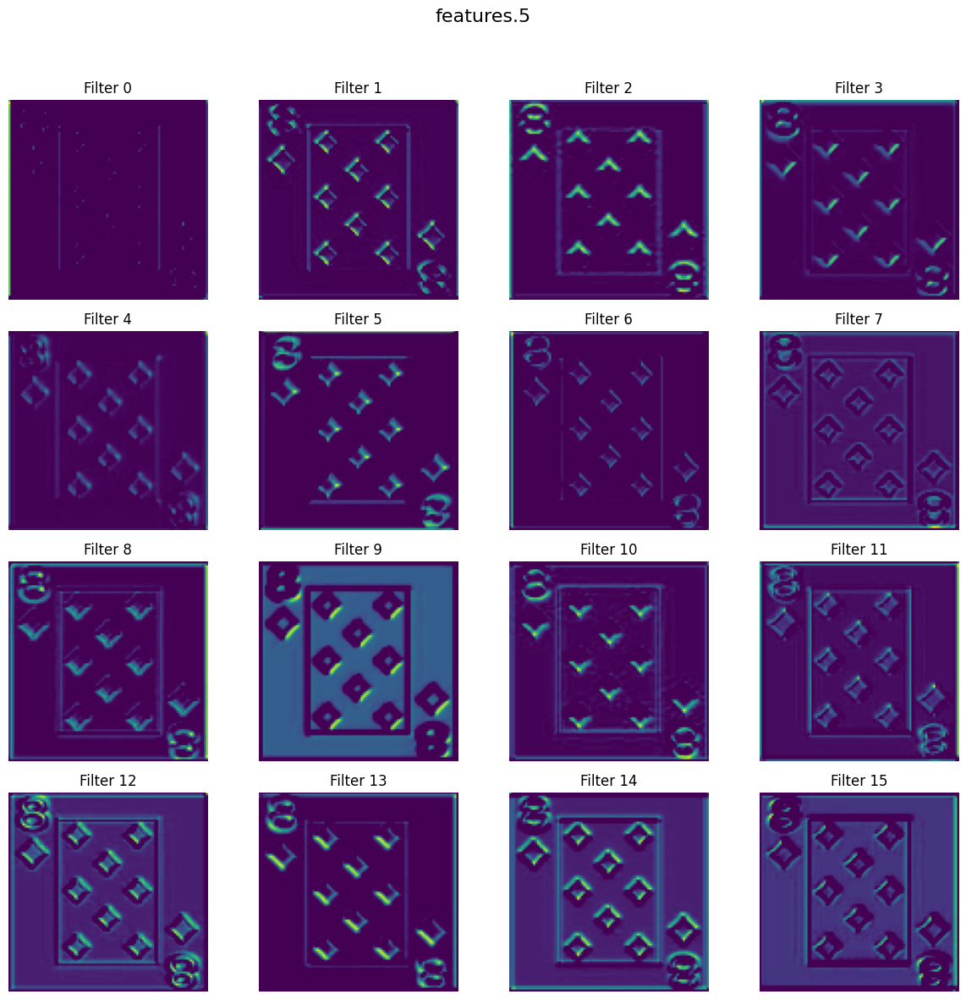

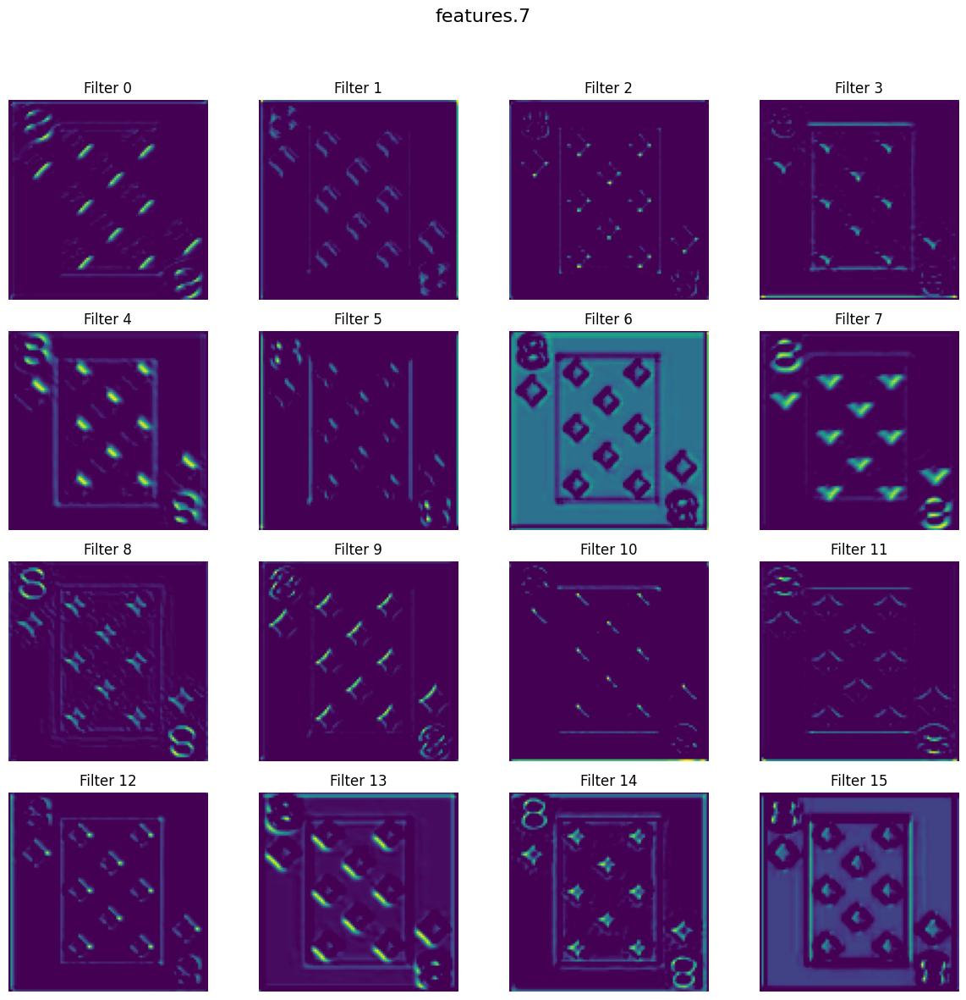

In [117]:
visualize_feature_maps(image_idx=12)

Feature Maps for 4 of Hearts

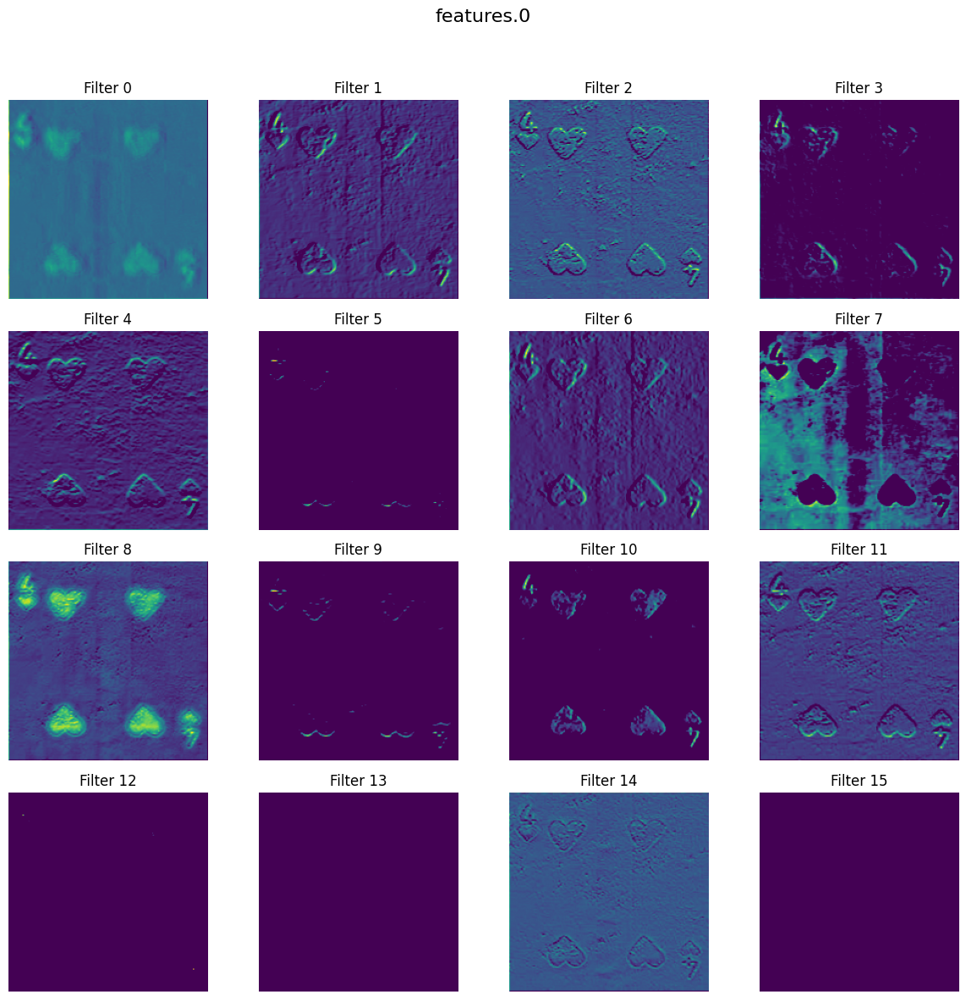

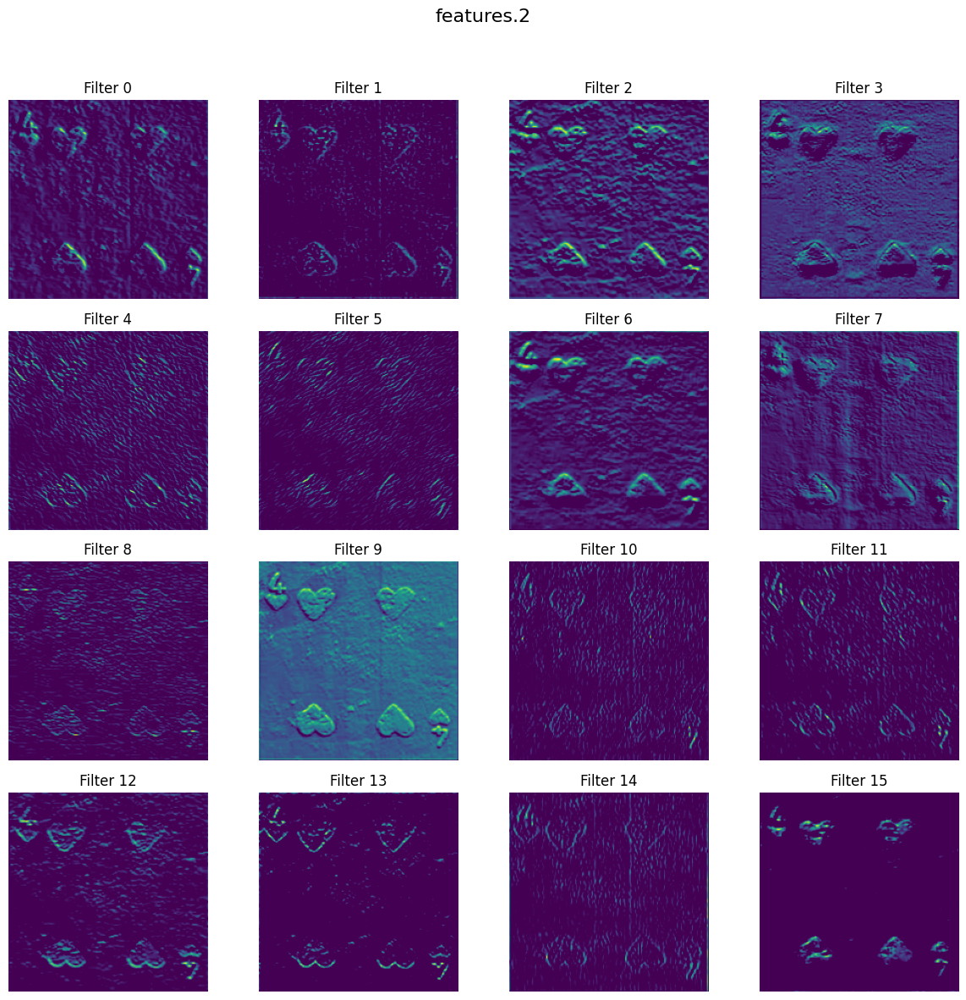

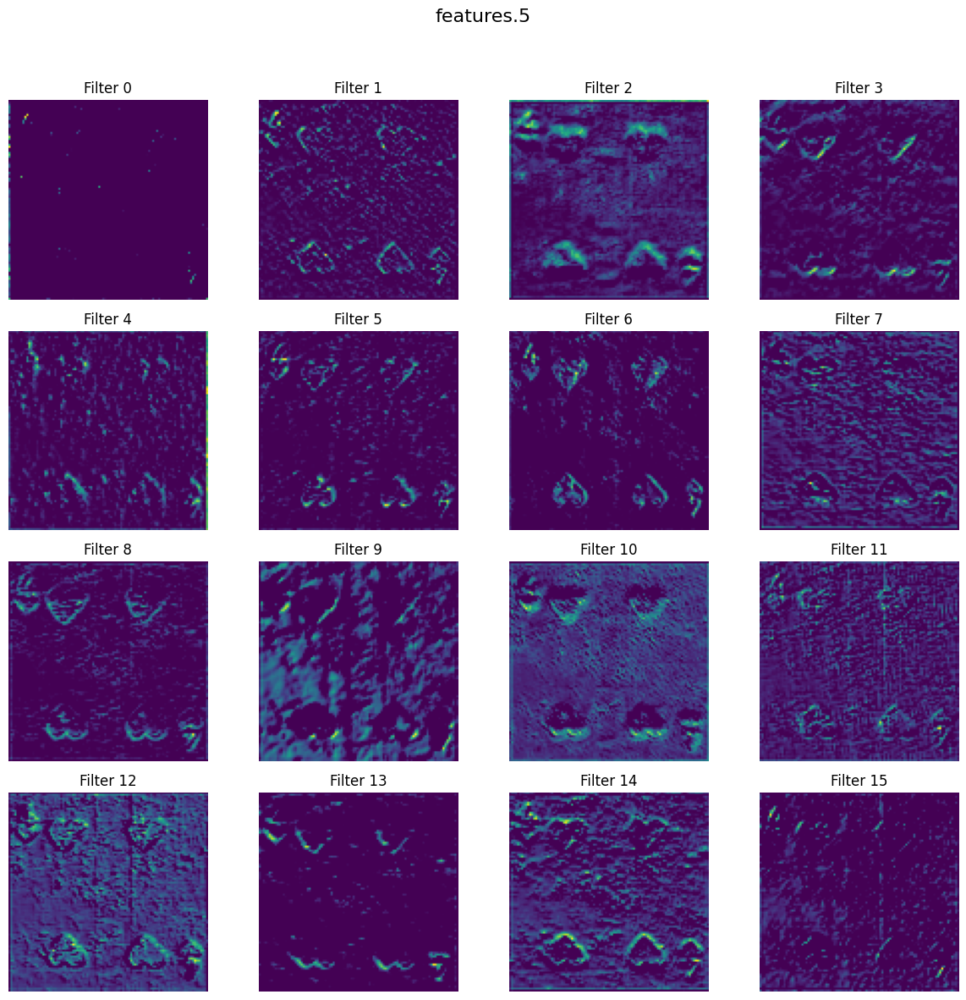

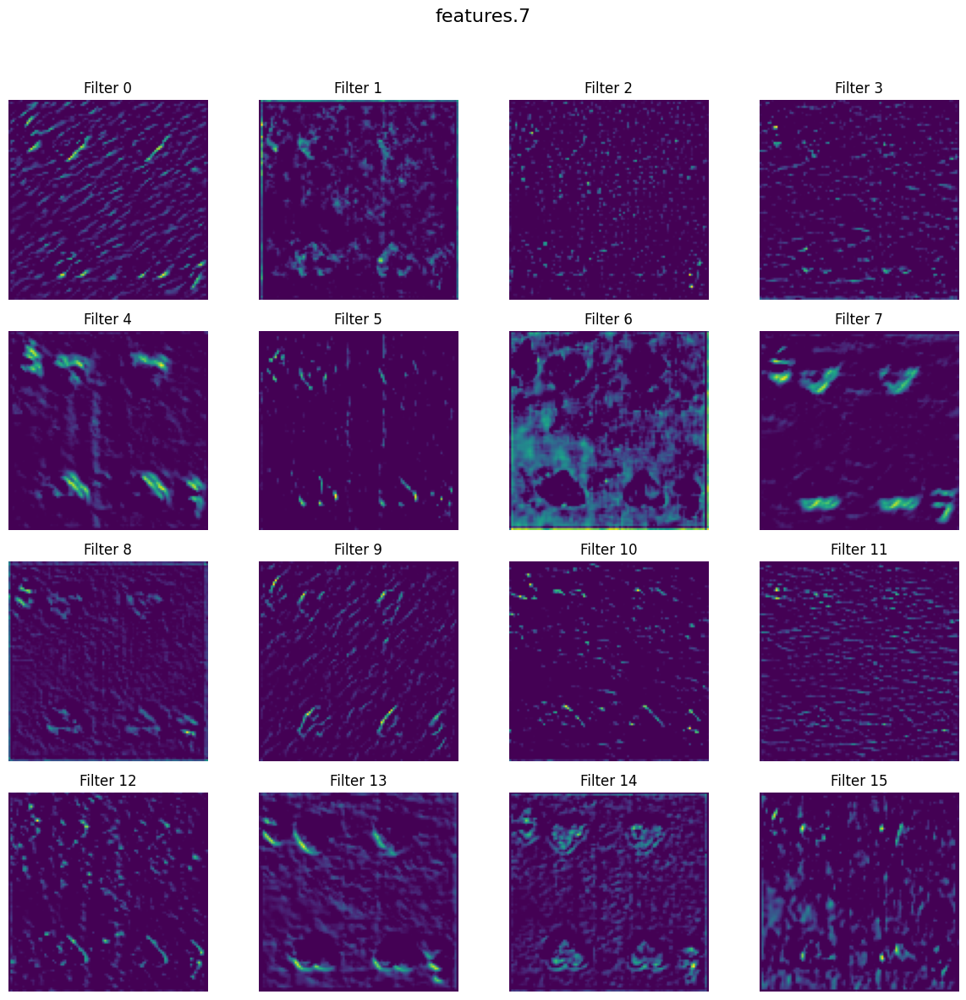

In [118]:
visualize_feature_maps(image_idx=21)